# Rating Prediction Fifa Dataset EDA

## Table of Contents

* [Load Dataset](#Load-Dataset)
* [Describe the Datasets](#Describe-the-Datasets)
* [Age Vs Overall](#Age-Vs-Overall)
* [Player's Overall over the years](#Player's-Overall-over-the-years)
* [Average overall for Each Age](#Average-overall-for-Each-Age)
* [Average Speed For Each Age](#Average-Speed-For-Each-Age)
* [Distributions](#Distributions-For-combined-Data)
* [Maps](#Maps)
* [Israel](#Israel)
* [Preferred Foot](#Preferred-Foot)
* [Skil Moves vs Overall](#Skil-Moves-vs-Overall)
* [Wage Distribution](#Wage-Distribution)
* [Biggest Improvements](#Biggest-Improvements)
* [Biggest Declines](#Biggest-Declines)
* [Heatmaps](#Heatmaps)
* [Rating Change Distribution](#Rating-Change-Distribution)




## Imports

In [3]:
import pandas as pd
import csv
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns


## Load Dataset

In [2]:
path_to_raw = "Dataset/Raw-Data"
output_folder = "Dataset/After-PreProcess"

In [3]:
f_2017 = pd.read_csv(path_to_raw+"/FIFA17_official_data.csv" ,low_memory = False)
f_2018 = pd.read_csv(path_to_raw+"/FIFA18_official_data.csv" ,low_memory = False)
f_2019 = pd.read_csv(path_to_raw+"/FIFA19_official_data.csv" ,low_memory = False)
f_2020 = pd.read_csv(path_to_raw+"/FIFA20_official_data.csv" ,low_memory = False)
f_2021 = pd.read_csv(path_to_raw+"/FIFA21_official_data.csv" ,low_memory = False)
f_2022 = pd.read_csv(path_to_raw+"/FIFA22_official_data.csv" ,low_memory = False)
f_2023 = pd.read_csv(path_to_raw+"/FIFA23_official_data.csv" ,low_memory = False)

In [33]:
conbined_DF = pd.concat([f_2017 , f_2018 , f_2019 , f_2020 , f_2021, f_2022, f_2023])

## Describe the Datasets

In [4]:
f_2017.describe()

,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,Crossing,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Best Overall Rating
count,17560.000000,17560.000000,17560.000000,17560.000000,17560.000000,17560.000000,17560.000000,17560.000000,17541.000000,17560.000000,...,17560.000000,17560.000000,17560.000000,17560.000000,17560.000000,17560.000000,17560.000000,17560.000000,17560.000000,17560.000000
mean,205606.310308,24.576310,66.155125,70.938326,1595.468223,1.111902,2.935820,2.305410,20.411265,49.778360,...,55.979954,44.225399,47.460194,45.540888,16.811333,16.536731,16.441856,16.596185,16.887927,65.620615
std,33102.038643,4.653748,7.013210,6.140487,269.862012,0.385032,0.657838,0.746962,17.047842,18.423713,...,13.301553,21.532570,21.785704,21.459058,17.796100,16.953668,16.589324,17.137032,18.034308,6.940057
min,16.000000,15.000000,45.000000,45.000000,751.000000,1.000000,1.000000,1.000000,1.000000,6.000000,...,5.000000,4.000000,3.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,44.000000
25%,191486.000000,21.000000,62.000000,67.000000,1452.000000,1.000000,3.000000,2.000000,9.000000,38.000000,...,47.000000,22.000000,26.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000,61.000000
50%,212936.000000,24.000000,66.000000,71.000000,1633.000000,1.000000,3.000000,2.000000,18.000000,54.000000,...,57.000000,48.000000,54.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000,66.000000
75%,229670.000000,28.000000,71.000000,75.000000,1786.000000,1.000000,3.000000,3.000000,27.000000,64.000000,...,66.000000,63.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000,70.000000
max,241056.000000,46.000000,94.000000,94.000000,2291.000000,5.000000,5.000000,5.000000,99.000000,91.000000,...,94.000000,92.000000,92.000000,91.000000,89.000000,91.000000,95.000000,91.000000,90.000000,92.000000


In [5]:
f_2018.describe()

,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,Crossing,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Best Overall Rating
count,17927.000000,17927.000000,17927.000000,17927.000000,17927.000000,17927.000000,17927.000000,17927.000000,17908.000000,17927.000000,...,17927.000000,17927.000000,17927.000000,17927.000000,17927.000000,17927.000000,17927.000000,17927.000000,17927.000000,17927.000000
mean,210947.301612,24.608021,66.219669,71.294026,1593.601272,1.118369,2.948290,2.326602,20.726491,49.741730,...,57.853461,44.161711,47.564958,45.607352,16.765995,16.537290,16.372957,16.527249,16.885424,65.668266
std,31098.675275,4.664180,6.918216,6.034964,273.732447,0.398509,0.657735,0.751463,17.037544,18.434466,...,12.723468,21.513237,21.779365,21.409992,17.840942,17.053389,16.617163,17.140435,18.124842,6.861089
min,16.000000,15.000000,46.000000,46.000000,742.000000,1.000000,1.000000,1.000000,1.000000,5.000000,...,5.000000,4.000000,6.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,45.000000
25%,197779.000000,21.000000,62.000000,67.000000,1450.000000,1.000000,3.000000,2.000000,9.000000,38.000000,...,51.000000,22.000000,26.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000,61.000000
50%,216633.000000,24.000000,66.000000,71.000000,1632.000000,1.000000,3.000000,2.000000,18.000000,54.000000,...,59.000000,48.000000,54.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000,66.000000
75%,233794.500000,28.000000,71.000000,75.000000,1784.000000,1.000000,3.000000,3.000000,27.000000,64.000000,...,67.000000,63.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000,70.000000
max,248068.000000,44.000000,94.000000,94.000000,2321.000000,5.000000,5.000000,5.000000,99.000000,92.000000,...,97.000000,92.000000,92.000000,91.000000,91.000000,91.000000,95.000000,91.000000,93.000000,93.000000


In [6]:
f_2019.describe()

,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,Crossing,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Best Overall Rating
count,17943.000000,17943.000000,17943.000000,17943.000000,17943.000000,17943.000000,17943.000000,17943.000000,17929.000000,17943.000000,...,17943.000000,17943.000000,17943.000000,17943.000000,17943.000000,17943.000000,17943.000000,17943.000000,17943.000000,17943.000000
mean,216447.995263,24.702057,66.331550,71.390793,1599.297665,1.107897,2.947277,2.368277,20.498355,49.874213,...,58.791339,47.262386,47.868082,45.820821,16.776737,16.532018,16.372959,16.539486,16.871816,65.771722
std,28988.660489,4.693238,6.879566,6.109331,276.606776,0.385554,0.664988,0.765885,16.532651,18.430707,...,11.577572,20.041492,21.638860,21.246583,17.903586,17.107419,16.718275,17.252367,18.212789,6.831813
min,16.000000,15.000000,48.000000,49.000000,718.000000,1.000000,1.000000,1.000000,1.000000,5.000000,...,12.000000,3.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,47.000000
25%,201980.000000,21.000000,62.000000,67.000000,1459.000000,1.000000,3.000000,2.000000,9.000000,38.000000,...,52.000000,30.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000,61.000000
50%,223676.000000,24.000000,66.000000,71.000000,1639.000000,1.000000,3.000000,2.000000,18.000000,54.000000,...,60.000000,53.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000,66.000000
75%,238359.500000,28.000000,71.000000,75.000000,1790.000000,1.000000,3.000000,3.000000,28.000000,64.000000,...,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000,70.000000
max,253155.000000,45.000000,94.000000,95.000000,2349.000000,5.000000,5.000000,5.000000,99.000000,93.000000,...,96.000000,94.000000,93.000000,90.000000,90.000000,92.000000,92.000000,91.000000,93.000000,94.000000


In [7]:
f_2020.describe()

,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,Crossing,...,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Best Overall Rating,DefensiveAwareness
count,17104.000000,17104.000000,17104.000000,17104.000000,17104.000000,17104.000000,17104.000000,17104.000000,17085.000000,17104.000000,...,1686.000000,17104.000000,17065.000000,17104.000000,17104.000000,17104.000000,17104.000000,17104.000000,17104.000000,15418.000000
mean,222134.781279,24.171363,66.421071,72.406221,1610.653473,1.140377,2.965856,2.419843,21.663623,50.708372,...,42.951957,47.553029,45.550308,15.656688,15.519761,15.445744,15.509822,15.749474,67.126111,46.917045
std,33364.077762,4.744398,7.377895,6.093877,269.489489,0.447171,0.664766,0.775061,17.515000,18.007770,...,20.320037,21.492352,21.140214,16.743474,16.063087,15.830051,16.180544,17.008903,7.249696,20.118732
min,16.000000,16.000000,28.000000,38.000000,571.000000,1.000000,1.000000,1.000000,1.000000,6.000000,...,5.000000,6.000000,4.000000,1.000000,1.000000,1.000000,1.000000,1.000000,36.000000,3.000000
25%,210356.500000,20.000000,61.000000,68.000000,1463.000000,1.000000,3.000000,2.000000,9.000000,39.000000,...,25.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000,62.000000,30.000000
50%,230293.000000,23.000000,66.000000,72.000000,1639.000000,1.000000,3.000000,2.000000,19.000000,55.000000,...,43.000000,54.000000,51.000000,11.000000,11.000000,11.000000,11.000000,11.000000,67.000000,52.000000
75%,243580.500000,27.000000,72.000000,76.000000,1798.000000,1.000000,3.000000,3.000000,28.000000,64.000000,...,60.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000,72.000000,64.000000
max,256488.000000,47.000000,94.000000,95.000000,2327.000000,5.000000,5.000000,5.000000,99.000000,94.000000,...,94.000000,93.000000,95.000000,90.000000,92.000000,93.000000,93.000000,91.000000,94.000000,94.000000


In [8]:
f_2021.describe()

,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,Crossing,...,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Best Overall Rating,DefensiveAwareness
count,17108.000000,17108.000000,17108.000000,17108.000000,17108.000000,17108.000000,17108.000000,17108.000000,17088.000000,17108.000000,...,942.000000,17108.000000,17069.000000,17108.000000,17108.000000,17108.000000,17108.000000,17108.000000,17108.000000,16166.000000
mean,221421.276187,25.053718,66.780161,72.553542,1625.722995,1.147533,2.981938,2.446107,20.756145,51.360065,...,46.403397,48.101473,45.933271,15.660744,15.529928,15.469839,15.550853,15.771510,67.753799,47.014475
std,36028.786065,4.915963,7.019069,5.738347,263.503922,0.455773,0.674699,0.780278,17.194590,17.954050,...,21.803653,21.532834,21.213315,16.910205,16.212333,15.977547,16.448905,17.209624,6.773192,20.152543
min,2.000000,16.000000,38.000000,46.000000,731.000000,1.000000,1.000000,1.000000,1.000000,6.000000,...,4.000000,5.000000,6.000000,1.000000,1.000000,1.000000,1.000000,1.000000,42.000000,3.000000
25%,205451.750000,21.000000,62.000000,69.000000,1484.000000,1.000000,3.000000,2.000000,9.000000,40.000000,...,25.250000,28.000000,25.000000,8.000000,8.000000,8.000000,8.000000,8.000000,63.000000,29.000000
50%,230441.000000,24.000000,67.000000,72.000000,1653.000000,1.000000,3.000000,2.000000,18.000000,55.000000,...,48.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000,68.000000,52.000000
75%,245402.500000,28.000000,72.000000,76.000000,1810.000000,1.000000,3.000000,3.000000,27.000000,65.000000,...,66.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000,72.000000,64.000000
max,259105.000000,53.000000,93.000000,95.000000,2316.000000,5.000000,5.000000,5.000000,99.000000,94.000000,...,94.000000,93.000000,95.000000,90.000000,92.000000,93.000000,93.000000,90.000000,93.000000,94.000000


In [9]:
f_2022.describe()

,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,Crossing,...,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Best Overall Rating,DefensiveAwareness
count,16710.000000,16710.000000,16710.000000,16710.000000,16710.000000,16710.000000,16710.000000,16710.000000,16684.000000,16710.000000,...,892.000000,16710.000000,16673.000000,16710.000000,16710.000000,16710.000000,16710.000000,16710.000000,16710.000000,15818.000000
mean,220560.467923,25.727409,67.646320,72.572292,1652.497307,1.169958,3.008199,2.475464,20.458643,52.212448,...,48.021300,49.155536,46.830564,15.683662,15.521364,15.457989,15.581927,15.789228,68.565410,48.019408
std,38496.607959,5.048910,6.457695,5.688085,257.271696,0.485305,0.681742,0.791414,17.699813,17.772348,...,21.904204,21.454857,21.175431,17.009757,16.302298,16.099993,16.584045,17.318251,6.256253,20.181354
min,27.000000,16.000000,28.000000,38.000000,571.000000,1.000000,1.000000,1.000000,1.000000,7.000000,...,4.000000,3.000000,6.000000,1.000000,1.000000,1.000000,1.000000,1.000000,36.000000,3.000000
25%,203891.250000,22.000000,63.000000,69.000000,1525.000000,1.000000,3.000000,2.000000,8.000000,42.000000,...,27.000000,29.000000,26.000000,8.000000,8.000000,8.000000,8.000000,8.000000,65.000000,30.000000
50%,229253.000000,25.000000,68.000000,72.000000,1687.000000,1.000000,3.000000,2.000000,17.000000,57.000000,...,53.000000,57.000000,54.000000,11.000000,11.000000,11.000000,11.000000,11.000000,68.000000,54.000000
75%,245368.750000,29.000000,72.000000,76.000000,1826.000000,1.000000,3.000000,3.000000,27.000000,65.000000,...,67.000000,67.000000,65.000000,14.000000,14.000000,14.000000,14.000000,14.000000,73.000000,65.000000
max,264704.000000,54.000000,93.000000,95.000000,2341.000000,5.000000,5.000000,5.000000,99.000000,94.000000,...,94.000000,93.000000,95.000000,91.000000,92.000000,93.000000,93.000000,90.000000,93.000000,93.000000


In [10]:
f_2023.describe()

,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Kit Number
count,17660.000000,17660.000000,17660.000000,17660.000000,17660.000000,17660.000000,17660.000000,17660.000000,17625.000000
mean,246319.424462,23.127746,63.369592,70.981200,1537.915855,1.106285,2.900340,2.297169,25.037957
std,31487.892861,4.639821,8.036268,6.529836,285.893809,0.407021,0.663523,0.754264,19.154116
min,16.000000,15.000000,43.000000,42.000000,749.000000,1.000000,1.000000,1.000000,1.000000
25%,240732.500000,20.000000,58.000000,67.000000,1387.000000,1.000000,3.000000,2.000000,11.000000
50%,257041.000000,22.000000,63.000000,71.000000,1548.000000,1.000000,3.000000,2.000000,22.000000
75%,263027.500000,26.000000,69.000000,75.000000,1727.000000,1.000000,3.000000,3.000000,32.000000
max,271340.000000,54.000000,91.000000,95.000000,2312.000000,5.000000,5.000000,5.000000,99.000000


In [11]:
f_2017.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17560 entries, 0 to 17559
Data columns (total 63 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        17560 non-null  int64  
 1   Name                      17560 non-null  object 
 2   Age                       17560 non-null  int64  
 3   Photo                     17560 non-null  object 
 4   Nationality               17560 non-null  object 
 5   Flag                      17560 non-null  object 
 6   Overall                   17560 non-null  int64  
 7   Potential                 17560 non-null  int64  
 8   Club                      17317 non-null  object 
 9   Club Logo                 17560 non-null  object 
 10  Value                     17560 non-null  object 
 11  Wage                      17560 non-null  object 
 12  Special                   17560 non-null  int64  
 13  Preferred Foot            17560 non-null  object 
 14  Intern

In [12]:
f_2017.isna().any()


ID                     False
Name                   False
Age                    False
Photo                  False
Nationality            False
                       ...  
GKKicking              False
GKPositioning          False
GKReflexes             False
Best Position          False
Best Overall Rating    False
Length: 63, dtype: bool

In [13]:
allSets = [f_2017, f_2018, f_2019, f_2020, f_2021, f_2022 , f_2023]

In [14]:
bigSet= [f_2017, f_2018, f_2019, f_2020, f_2021, f_2022]

In [17]:
def age_vs_overall(df):
    mean_overall = df.groupby("Age")["Overall"].mean()
    plt.scatter(df["Age"], df["Overall"])
    # add labels to the x and y axes
    plt.xlabel("Age")
    plt.ylabel("Overall Grade")
    plt.plot(mean_overall.index, mean_overall.values, color='red', label='Average', linewidth=3.0)
    # add a legend to the plot
    plt.legend()
    # show the plot
    plt.figure(figsize=(10,6))
    return plt

## Age Vs Overall

<module 'matplotlib.pyplot' from 'C:\\Users\\roial\\AppData\\Roaming\\Python\\Python38\\site-packages\\matplotlib\\pyplot.py'>

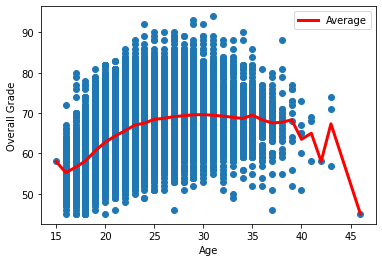

<Figure size 720x432 with 0 Axes>

In [18]:
age_vs_overall(f_2017)

<module 'matplotlib.pyplot' from 'C:\\Users\\roial\\AppData\\Roaming\\Python\\Python38\\site-packages\\matplotlib\\pyplot.py'>

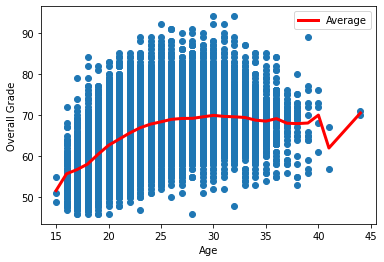

<Figure size 720x432 with 0 Axes>

In [19]:
age_vs_overall(f_2018)

<module 'matplotlib.pyplot' from 'C:\\Users\\roial\\AppData\\Roaming\\Python\\Python38\\site-packages\\matplotlib\\pyplot.py'>

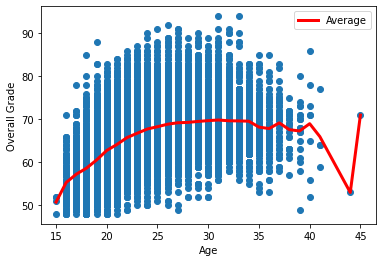

<Figure size 720x432 with 0 Axes>

In [20]:
age_vs_overall(f_2019)

<module 'matplotlib.pyplot' from 'C:\\Users\\roial\\AppData\\Roaming\\Python\\Python38\\site-packages\\matplotlib\\pyplot.py'>

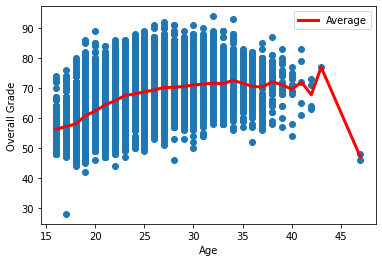

<Figure size 720x432 with 0 Axes>

In [21]:
age_vs_overall(f_2020)

<module 'matplotlib.pyplot' from 'C:\\Users\\roial\\AppData\\Roaming\\Python\\Python38\\site-packages\\matplotlib\\pyplot.py'>

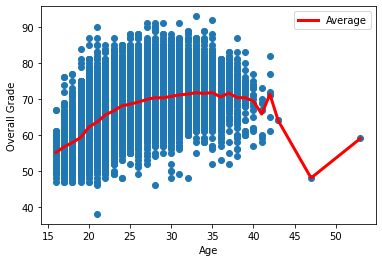

<Figure size 720x432 with 0 Axes>

In [22]:
age_vs_overall(f_2021)

<module 'matplotlib.pyplot' from 'C:\\Users\\roial\\AppData\\Roaming\\Python\\Python38\\site-packages\\matplotlib\\pyplot.py'>

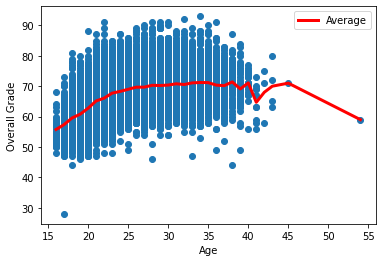

<Figure size 720x432 with 0 Axes>

In [23]:
age_vs_overall(f_2022)

<module 'matplotlib.pyplot' from 'C:\\Users\\roial\\AppData\\Roaming\\Python\\Python38\\site-packages\\matplotlib\\pyplot.py'>

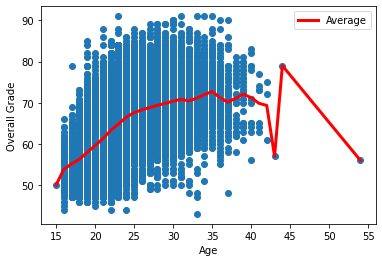

<Figure size 720x432 with 0 Axes>

In [24]:
age_vs_overall(f_2023)

In [25]:
def age_vs_overall_allSets(dataframes , startYear = 2017):
    means = []
    for idx , dataframe in enumerate(dataframes):
        mean_overall = dataframe.groupby("Age")["Overall"].mean()
        means.append(mean_overall)
        startYear= startYear + 1
    dfCombined = pd.concat(means, axis=1)
    df_mean = dfCombined.mean(axis=1)
    df_mean.sort_index(inplace=True)
    plt.xlabel("Age")
    plt.ylabel("Overall Grade")
    plt.plot(df_mean.index, df_mean.values, color='red', label='Average', linewidth=3.0)
    plt.figure(figsize=(10,6))
    return plt
    return plt

<module 'matplotlib.pyplot' from 'C:\\Users\\roial\\AppData\\Roaming\\Python\\Python38\\site-packages\\matplotlib\\pyplot.py'>

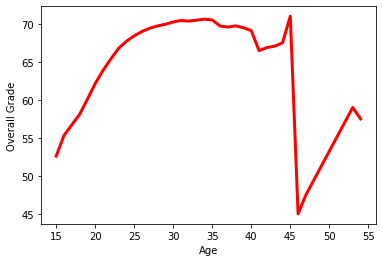

<Figure size 720x432 with 0 Axes>

In [66]:
age_vs_overall_allSets(allSets)

In [79]:
age_vs_overall(f_2023)

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,...,GKKicking,GKPositioning,GKReflexes,Best Position,Best Overall Rating,version,Next_Overall,Release Clause,DefensiveAwareness,Kit Number
0,0,176580,L. Suárez,29,https://cdn.sofifa.com/players/176/580/17_60.png,Uruguay,https://cdn.sofifa.com/flags/uy.png,92,92,FC Barcelona,...,31.0,33.0,37.0,ST,88.0,2017,92.0,NaN,NaN,NaN
1,1,178518,R. Nainggolan,28,https://cdn.sofifa.com/players/178/518/17_60.png,Belgium,https://cdn.sofifa.com/flags/be.png,86,86,Roma,...,14.0,8.0,11.0,CDM,84.0,2017,86.0,NaN,NaN,NaN
2,2,181872,A. Vidal,29,https://cdn.sofifa.com/players/181/872/17_60.png,Chile,https://cdn.sofifa.com/flags/cl.png,87,87,FC Bayern München,...,4.0,2.0,4.0,CDM,85.0,2017,86.0,NaN,NaN,NaN
3,3,197445,D. Alaba,24,https://cdn.sofifa.com/players/197/445/17_60.png,Austria,https://cdn.sofifa.com/flags/at.png,86,89,FC Bayern München,...,14.0,15.0,9.0,LB,84.0,2017,85.0,NaN,NaN,NaN
4,4,195864,P. Pogba,23,https://cdn.sofifa.com/players/195/864/17_60.png,France,https://cdn.sofifa.com/flags/fr.png,88,94,Manchester United,...,2.0,4.0,3.0,CAM,85.0,2017,88.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122007,17655,269526,Deng Xiongtao,19,https://cdn.sofifa.net/players/269/526/23_60.png,China PR,https://cdn.sofifa.net/flags/cn.png,48,61,Meizhou Hakka,...,NaN,NaN,NaN,NaN,NaN,2023,NaN,€218K,NaN,35.0
122008,17656,267946,22 Lim Jun Sub,17,https://cdn.sofifa.net/players/267/946/22_60.png,Korea Republic,https://cdn.sofifa.net/flags/kr.png,48,64,Jeju United FC,...,NaN,NaN,NaN,NaN,NaN,2023,NaN,€188K,NaN,21.0
122009,17657,270567,A. Demir,25,https://cdn.sofifa.net/players/270/567/23_60.png,Turkey,https://cdn.sofifa.net/flags/tr.png,51,56,Ümraniyespor,...,NaN,NaN,NaN,NaN,NaN,2023,NaN,€142K,NaN,12.0
122010,17658,256624,21 S. Czajor,18,https://cdn.sofifa.net/players/256/624/21_60.png,Poland,https://cdn.sofifa.net/flags/pl.png,50,65,Fleetwood Town,...,NaN,NaN,NaN,NaN,NaN,2023,NaN,€214K,NaN,40.0


<module 'matplotlib.pyplot' from 'C:\\Users\\roial\\AppData\\Roaming\\Python\\Python38\\site-packages\\matplotlib\\pyplot.py'>

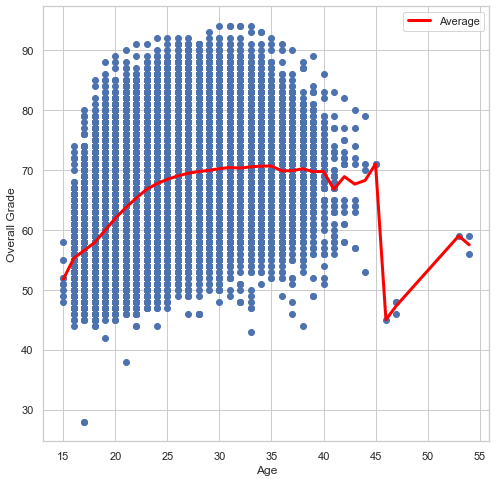

<Figure size 720x432 with 0 Axes>

In [80]:
age_vs_overall(conbined_DF)

## Player's Overall over the years

In [10]:
def plot_player_overall(idx, dataframes):
    overall_data = []
    year = 2017    
    for df in dataframes:
        found = False
        if idx in df['ID'].values:
            found = True
            overall_data.append(df.loc[df['ID'] == idx, 'Overall'].values[0])
        if not found:
            overall_data.append(0)
        year = year + 1
    plt.plot(range(2017, 2024), overall_data)
    plt.xlabel('Year')
    plt.ylabel('Overall')
    plt.title(f'{get_player_name(idx, dataframes)} Overall Scores')
    plt.show()
    return overall_data

In [11]:
def plot_player_overall_with_age(idx, dataframes):
    overall_data = []
    player_age =[]
    year = 2017    
    for df in dataframes:
        found = False
        if idx in df['ID'].values:
            found = True
            overall_data.append(df.loc[df['ID'] == idx, 'Overall'].values[0])
            player_age.append(df.loc[df['ID'] == idx, 'Age'].values[0])
        if not found:
            overall_data.append(0)
        year = year + 1
    plt.plot(player_age, overall_data)
    plt.xlabel('Age')
    plt.ylabel('Overall')
    plt.title(f'{get_player_name(idx, dataframes)} Overall Scores')
    plt.show()
    return overall_data

In [12]:
def playerr_rating_df(idx, dataframes):
    overall_data = []  
    for df in dataframes:
        found = False
        if idx in df['ID'].values:
            found = True
            overall_data.append(df.loc[df['ID'] == idx, 'Overall'].values[0])
        if not found:
            overall_data.append(0)
    df1 = pd.DataFrame(columns=[list(range(2017, 2024))])
    df1.loc[0] = overall_data
    df1["2024"] ="?"
    df1.index = [get_player_name(idx, dataframes)]
    return df1

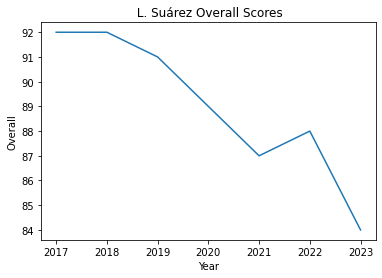

[92, 92, 91, 89, 87, 88, 84]

In [26]:
plot_player_overall(176580 ,allSets)

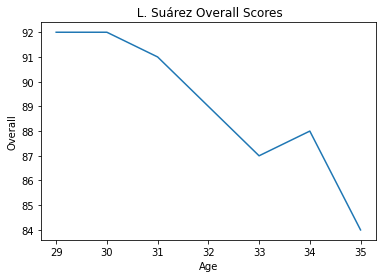

[92, 92, 91, 89, 87, 88, 84]

In [80]:
plot_player_overall_with_age(176580,allSets)

In [13]:
def get_player_name(idx, dataframes):
    for df in dataframes:
        if idx in df['ID'].values:
            name = df.loc[df['ID'] == idx, 'Name'].values[0]
            return name
    return "Player Not Found"

In [14]:
get_player_name(176580 ,allSets)

' L. Suárez'

In [14]:
def age_vs_overall(df):
    mean_overall = df.groupby("Age")["Overall"].mean()
    plt.scatter(df["Age"], df["Overall"])
    # add labels to the x and y axes
    plt.xlabel("Age")
    plt.ylabel("Overall Grade")
    plt.plot(mean_overall.index, mean_overall.values, color='red', label='Average', linewidth=3.0)
    # add a legend to the plot
    plt.legend()
    # show the plot
    plt.figure(figsize=(10,6))
    return plt

In [15]:
def get_player_id(name, dataframes):
    for df in dataframes:
        if name in df['Name'].values:
            idx = df.loc[df['Name'] == name, 'ID'].values[0]
            return idx
    return "Player Not Found"

In [35]:
get_player_id(" Casillas", allSets)

5479

In [36]:
get_player_name(5479 ,allSets)

' Casillas'

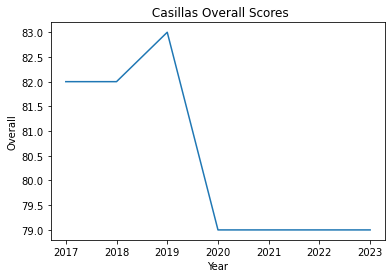

[82, 82, 83, 79, 79, 79, 79]

In [37]:
plot_player_overall(5479 ,allSets)

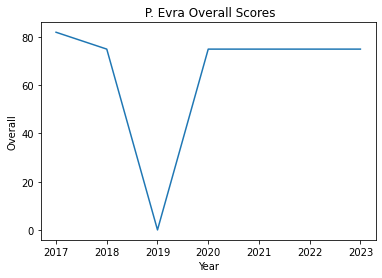

[82, 75, 0, 75, 75, 75, 75]

In [38]:
plot_player_overall(52091 ,allSets)

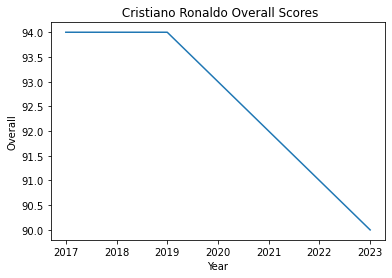

[94, 94, 94, 93, 92, 91, 90]

In [11]:
plot_player_overall(20801 ,allSets)

In [29]:
playerr_rating_df(20801 ,allSets)

,2017,2018,2019,2020,2021,2022,2023,2024
Cristiano Ronaldo,94,94,94,93,92,91,90,?


In [30]:
playerr_rating_df(158023 ,allSets)

,2017,2018,2019,2020,2021,2022,2023,2024
L. Messi,93,94,94,94,93,93,91,?


In [33]:
pd.concat([playerr_rating_df(158023 ,allSets) , playerr_rating_df(20801 ,allSets)])

,2017,2018,2019,2020,2021,2022,2023,2024
L. Messi,93,94,94,94,93,93,91,?
Cristiano Ronaldo,94,94,94,93,92,91,90,?


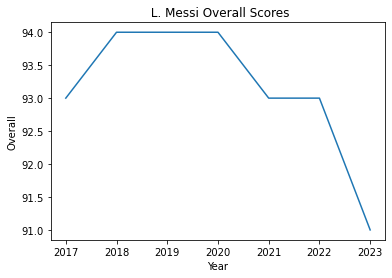

[93, 94, 94, 94, 93, 93, 91]

In [12]:
plot_player_overall(158023 ,allSets)

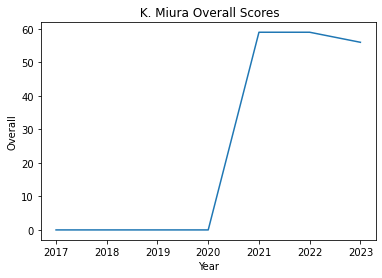

[0, 0, 0, 0, 59, 59, 56]

In [58]:
plot_player_overall(254704 ,allSets)

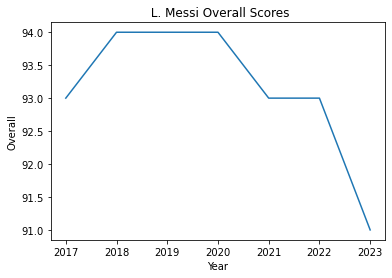

[93, 94, 94, 94, 93, 93, 91]

In [59]:
plot_player_overall(158023 ,allSets)

## Average overall for Each Age

In [40]:
def age_vs_overall_over_7_years(df):
    for 
    mean_overall = df.groupby("Age")["Overall"].mean()
    return mean_overall

In [43]:
age_vs_overall(f_2017)

Age
15    58.000000
16    55.248175
17    56.586130
18    58.141942
19    60.659341
20    62.769608
21    64.298814
22    65.587681
23    66.995279
24    67.500345
25    68.441176
26    68.699739
27    69.125465
28    69.330909
29    69.574443
30    69.601100
31    69.469492
32    69.237705
33    68.952239
34    68.659574
35    69.487952
36    68.318681
37    67.561404
38    67.703704
39    68.333333
40    63.500000
41    65.000000
42    58.000000
43    67.333333
46    45.000000
Name: Overall, dtype: float64

In [29]:
def age_vs_field_allSets(dataframes , startYear = 2017 , field="Overall" ):
    means = []
    for idx , dataframe in enumerate(dataframes):
        mean_overall = dataframe.groupby("Age")[field].mean()
        means.append(mean_overall)
        startYear= startYear + 1
    dfCombined = pd.concat(means, axis=1)
    df_mean = dfCombined.mean(axis=1)
    df_mean.sort_index(inplace=True)
#     df_mean.sort_values('Age')
    plt.xlabel("Age")
    plt.ylabel("Average "+field)
    plt.plot(df_mean.index, df_mean.values, color='red', label='Average', linewidth=3.0)
    plt.figure(figsize=(10,6))
#     print(df_mean.values)
    return plt
#     return df_mean

## Average Speed For Each Age

<module 'matplotlib.pyplot' from 'C:\\Users\\roial\\AppData\\Roaming\\Python\\Python38\\site-packages\\matplotlib\\pyplot.py'>

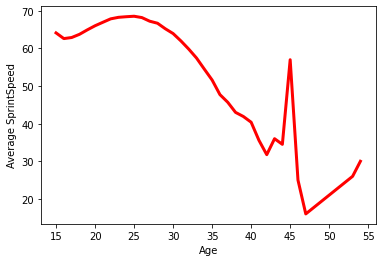

<Figure size 720x432 with 0 Axes>

In [32]:
age_vs_field_allSets(bigSet ,  field="SprintSpeed")

## Distributions For combined Data

## Potential Distribution

In [27]:
def x_y_t(xaxis, yaxis, title):
    #this function contains graph titles
    plt.xlabel(xaxis)
    plt.ylabel(yaxis)
    plt.title(title)

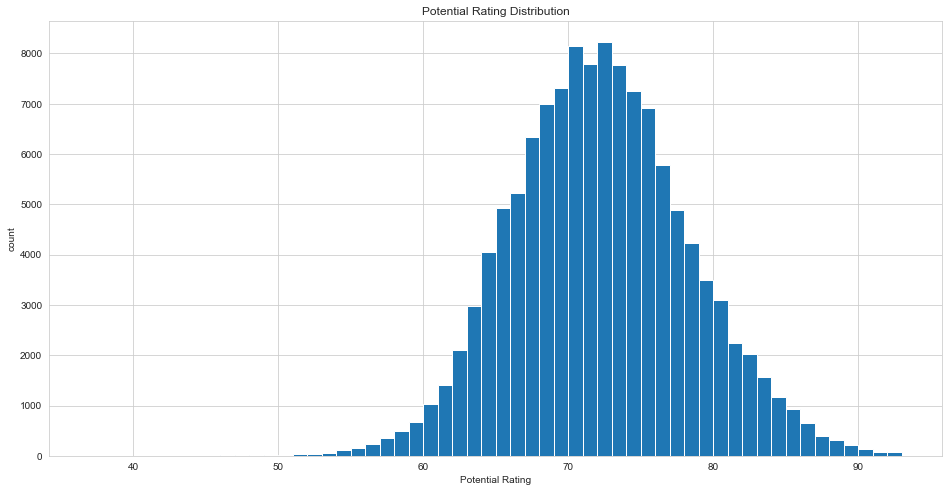

In [71]:

plt.figure(figsize=(16,8))
bins=np.arange(conbined_DF['Potential'].min()-1, conbined_DF['Potential'].max()-1, 1)
plt.hist(data = conbined_DF, x = 'Potential', bins=bins);
sns.set_style("whitegrid")
x_y_t('Potential Rating', 'count', 'Potential Rating Distribution')

## Overall Distribution

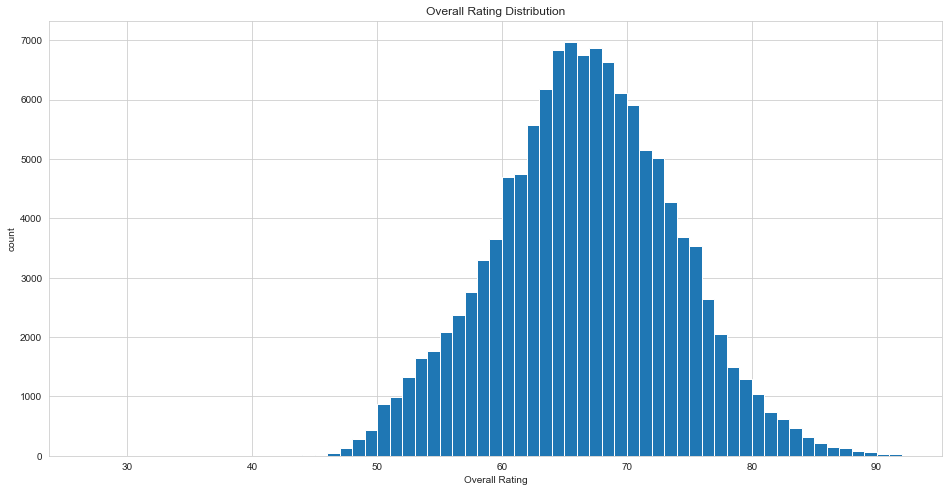

In [73]:
##Overall 
plt.figure(figsize=(16,8))
bins=np.arange(conbined_DF['Overall'].min()-1, conbined_DF['Overall'].max()-1, 1)
plt.hist(data = conbined_DF, x = 'Overall', bins=bins);
sns.set_style("whitegrid")
x_y_t('Overall Rating', 'count', 'Overall Rating Distribution')

## Pace Distribution

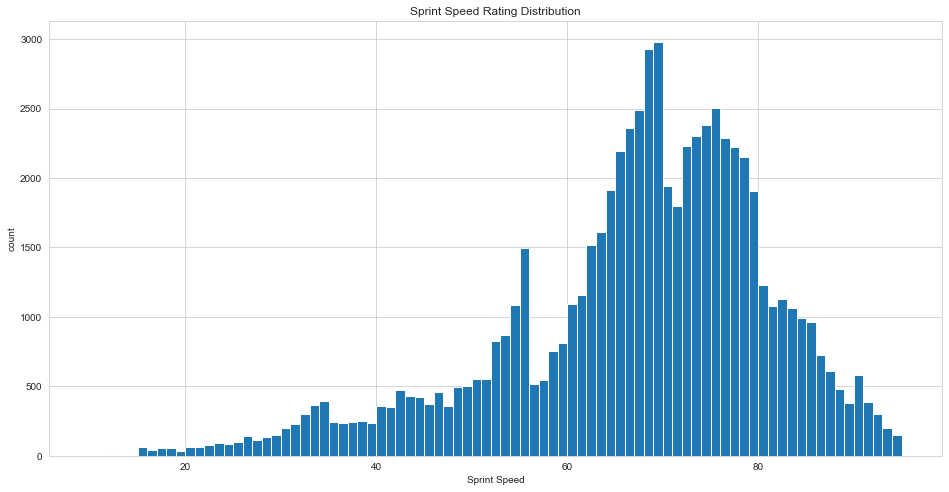

In [28]:
##Overall 
plt.figure(figsize=(16,8))
bins=np.arange(conbined_DF['SprintSpeed'].min()-1, conbined_DF['SprintSpeed'].max()-1, 1)
plt.hist(data = conbined_DF, x = 'SprintSpeed', bins=bins);
sns.set_style("whitegrid")
x_y_t('Sprint Speed', 'count', 'Sprint Speed Rating Distribution')

## Maps

In [29]:
from plotly.offline import iplot, init_notebook_mode
# Grouping the data by countries
def make_players_distribution(df):
    valcon = df.groupby("Nationality").size().reset_index(name="Count")

    # Plotting the choropleth map
    init_notebook_mode()
    plotmap = [ dict(
            type = 'choropleth',
            locations = valcon["Nationality"],
            locationmode = 'country names',
            z = valcon["Count"],
            text = valcon["Nationality"],
            autocolorscale = False,  # set to False to use a custom color scale
            colorscale = 'Reds',    # set the colorscale to 'Blues'
            reversescale = False,
            marker = dict(
                line = dict (
                    color = 'rgb(180,180,180)',
                    width = 0.5
                ) ),
            colorbar = dict(
                title = "Amount of Players"),
          ) ]

    layout = dict(
        title = "Nationalities of FIFA Players",
        geo = dict(
            showframe = False,
            showcoastlines = False,
            projection = dict(
                type = 'aitoff'
            )
        )
    )

    fig = dict( data=plotmap, layout=layout)
    iplot(fig)

In [34]:
make_players_distribution(conbined_DF)

In [35]:
from plotly.offline import iplot, init_notebook_mode
# Grouping the data by countries
def make_players_distribution_overall(df):
    valcon = df.groupby("Nationality")['Overall'].mean().reset_index(name="AverageGrade")

    # Plotting the choropleth map
    init_notebook_mode()
    plotmap = [ dict(
            type = 'choropleth',
            locations = valcon["Nationality"],
            locationmode = 'country names',
            z = valcon["AverageGrade"],
            text = valcon["Nationality"],
            autocolorscale = False,  # set to False to use a custom color scale
            colorscale = 'Blues',    # set the colorscale to 'Blues'
            reversescale = False,
            marker = dict(
                line = dict (
                    color = 'rgb(180,180,180)',
                    width = 0.5
                ) ),
            colorbar = dict(
                title = "Average Grade of Players"),
          ) ]

    layout = dict(
        title = "Average Grade of FIFA Players",
        geo = dict(
            showframe = False,
            showcoastlines = False,
            projection = dict(
                type = 'aitoff'
            )
        )
    )

    fig = dict( data=plotmap, layout=layout)
    iplot(fig)

In [36]:
make_players_distribution_overall(conbined_DF)

In [37]:
make_players_distribution(f_2017)

In [38]:
valcon = f_2017.groupby("Nationality").size().reset_index(name="Count")

In [39]:
valcon

,Nationality,Count
0,Afghanistan,1
1,Albania,37
2,Algeria,51
3,Angola,11
4,Antigua & Barbuda,4
...,...,...
155,Uzbekistan,3
156,Venezuela,45
157,Wales,120
158,Zambia,4


## Israel

In [40]:
def get_count_by_country(df, country):
    """
    Takes a pandas dataframe and a country name, and returns the count value for that country.
    """
    count = df.loc[df['Nationality'] == country, 'Count'].values[0]
    return count

In [41]:
get_count_by_country(valcon , "Israel")

13

In [51]:
range(2017, 2024)

range(2017, 2024)

In [16]:
def get_graph_players_per_country(dfs , country):
    years = []
    num_of_players=[]
    year = 2017
    for df in dfs:
        valcon = df.groupby("Nationality").size().reset_index(name="Count")
        years.append(year)
        year = year+1
        num_of_players.append(get_count_by_country(valcon, country))
    plt.xlabel("Years")
    plt.ylabel("Number of Players from "+country)
    plt.plot(years, num_of_players, color='blue', label='Average', linewidth=3.0)
    plt.figure(figsize=(10,6))

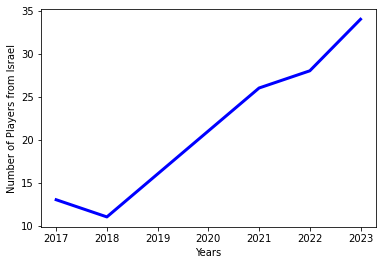

<Figure size 720x432 with 0 Axes>

In [61]:
get_graph_players_per_country(allSets , "Israel")

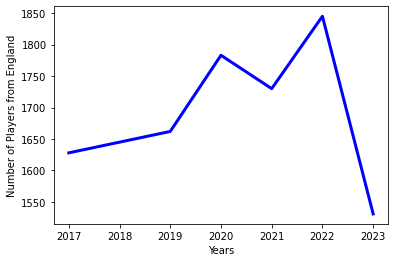

<Figure size 720x432 with 0 Axes>

In [62]:
get_graph_players_per_country(allSets , "England")

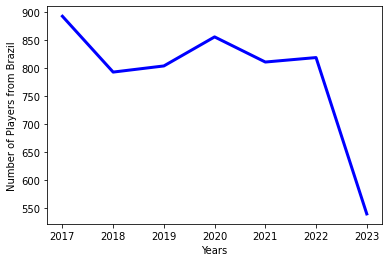

<Figure size 720x432 with 0 Axes>

In [63]:
get_graph_players_per_country(allSets , "Brazil")

## Preferred Foot

In [26]:
of_interest = ['Weak Foot', 'Skill Moves', "Preferred Foot"]
my_pal = {0: "firebrick", 1: "navy"}


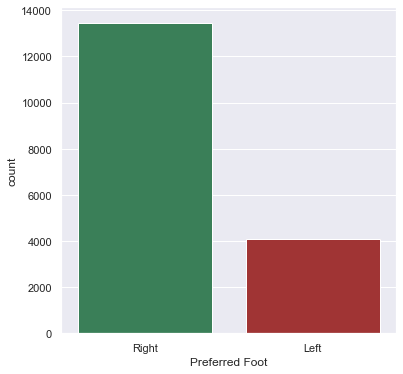

In [22]:
sns.set(rc={'figure.figsize':(6,6)})
sns.countplot(x=f_2017['Preferred Foot'], 
              label='count', 
              palette=['seagreen', 'firebrick'])
plt.show()

## Skil Moves vs Overall

Text(0.5, 1.0, 'Overall as skill moves')

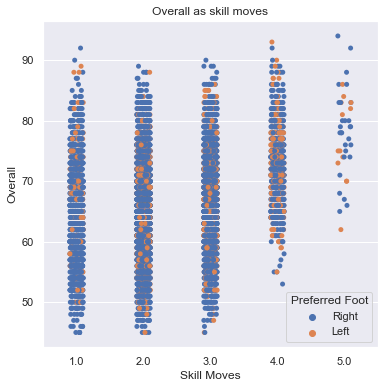

In [30]:
sns.stripplot(x='Skill Moves' , y='Overall', hue="Preferred Foot", dodge=False ,data =f_2017).set_title("Overall as skill moves")

Text(0.5, 1.0, 'Overall as skill moves')

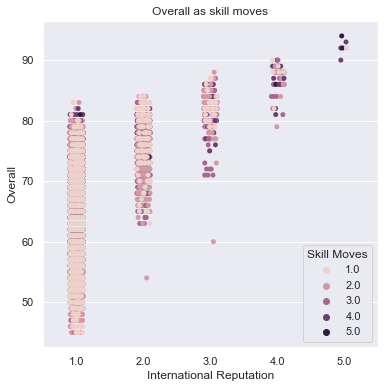

In [28]:
sns.stripplot(x='International Reputation' , y='Overall', hue="Skill Moves", dodge=False ,data =f_2017).set_title("Overall as skill moves")

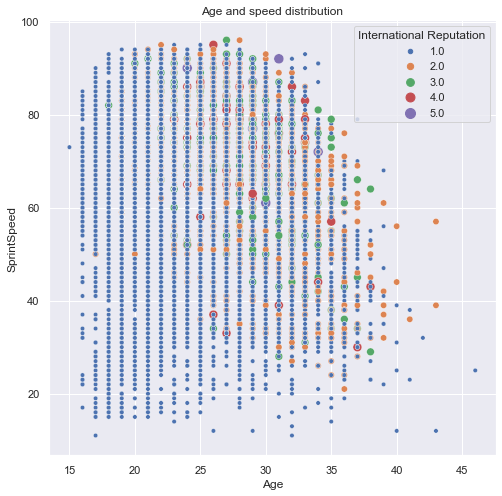

In [63]:
# plt.scatter(f_2017["Age"], f_2017["SprintSpeed"])
sns.set(rc={'figure.figsize':(8,8)})
sns.scatterplot(data=f_2017, x="Age", y="SprintSpeed", hue="International Reputation" ,  palette="deep" , size="International Reputation",
    sizes=(20, 100))
x_y_t('Age', 'SprintSpeed', 'Age and speed distribution')
plt.show()

## Wage Distribution

In [9]:
import re

def convert_wage_to_int(wage_str):
    match = re.match(r"€(\d+)(K?)", wage_str)
    if match:
        wage_int = int(match.group(1)) * (1000 if match.group(2) == "K" else 1)
        return wage_int
    else:
        raise ValueError("Invalid wage format")

In [10]:
f_2019[""].apply(convert_wage_to_int)

0        450000
1        140000
2        425000
3         20000
4        350000
          ...  
17938       500
17939      2000
17940      1000
17941       500
17942       500
Name: Wage, Length: 17943, dtype: int64

<AxesSubplot:xlabel='Wage', ylabel='Potential'>

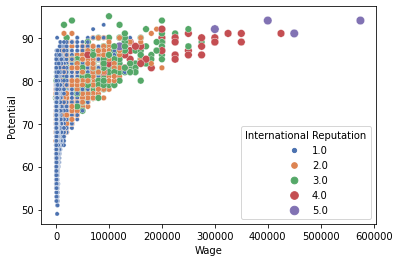

In [13]:
sns.scatterplot(x=f_2019['Wage'].apply(convert_wage_to_int), y=f_2019['Potential'] , hue=f_2019["International Reputation"] ,  palette="deep" , size=f_2019["International Reputation"])

<AxesSubplot:xlabel='Wage', ylabel='Overall'>

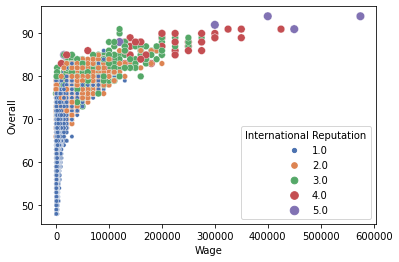

In [14]:
sns.scatterplot(x=f_2019['Wage'].apply(convert_wage_to_int), y=f_2019['Overall'] , hue=f_2019["International Reputation"] ,  palette="deep" , size=f_2019["International Reputation"])


<AxesSubplot:xlabel='Potential', ylabel='Overall'>

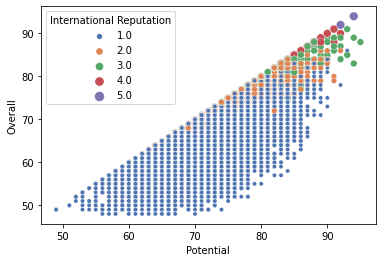

In [15]:
sns.scatterplot(x=f_2019['Potential'], y=f_2019['Overall'] , hue=f_2019["International Reputation"] ,  palette="deep" , size=f_2019["International Reputation"])


EDA Part 2

In [4]:
fifa_path = r"Dataset\After-PreProcess\predict-by-rating"

In [5]:
cmbnd_df = pd.read_csv(fifa_path+"/Combined_Data.csv" ,low_memory = False)

In [6]:
cmbnd_df.columns

Index(['Unnamed: 0', 'ID', 'Name', 'Age', 'Overall', 'Potential', 'Club',
       'Value', 'Wage', 'International Reputation', 'Weak Foot', 'Skill Moves',
       'Work Rate', 'Position', 'Height', 'Weight', 'Crossing', 'Finishing',
       'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling', 'Curve',
       'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
       'GKKicking', 'GKPositioning', 'GKReflexes', 'Best Position', 'version',
       'Next_Overall', 'Next_Year_Club', 'DefensiveAwareness'],
      dtype='object')

In [7]:
cmbnd_df

,Unnamed: 0,ID,Name,Age,Overall,Potential,Club,Value,Wage,International Reputation,...,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Best Position,version,Next_Overall,Next_Year_Club,DefensiveAwareness
0,0,176580,L. Suárez,29,92,92,FC Barcelona,107500000,250000,5.0,...,27.0,25.0,31.0,33.0,37.0,ST,2017,92.0,FC Barcelona,50
1,1,178518,R. Nainggolan,28,86,86,Roma,93000000,140000,3.0,...,11.0,11.0,14.0,8.0,11.0,CDM,2017,86.0,Roma,79
2,2,181872,A. Vidal,29,87,87,FC Bayern München,44500000,135000,4.0,...,4.0,2.0,4.0,2.0,4.0,CDM,2017,86.0,FC Bayern München,85
3,3,197445,D. Alaba,24,86,89,FC Bayern München,125500000,350000,4.0,...,5.0,7.0,14.0,15.0,9.0,LB,2017,85.0,FC Bayern München,81
4,4,195864,P. Pogba,23,88,94,Manchester United,37000000,45000,4.0,...,5.0,6.0,2.0,4.0,3.0,CAM,2017,88.0,Manchester United,72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68477,16698,254562,A. Abaz,19,50,70,FC St. Gallen 1879,120000,500,1.0,...,49.0,53.0,50.0,48.0,50.0,GK,2022,50.0,FC Winterthur,7
68478,16699,262373,F. Chalupniczak,20,51,63,Sutton United,120000,800,1.0,...,50.0,52.0,51.0,51.0,52.0,GK,2022,51.0,Sutton United,9
68479,16701,263373,J. Searle,20,51,64,Swansea City,120000,2000,1.0,...,51.0,53.0,52.0,49.0,50.0,GK,2022,51.0,Barnsley,7
68480,16703,259718,F. Gebhardt,19,52,66,FC Basel 1893,170000,650,1.0,...,53.0,45.0,47.0,52.0,57.0,GK,2022,58.0,Hallescher FC,6


## Biggest Improvements

In [8]:
def get_top_10_Leaps(df, col1, col2):
    # Compute the absolute difference between the two columns
    diff = (df[col1] - df[col2]).abs()

    # Sort the resulting Series in descending order and return the top 10 values
#     top_10_diff = diff.sort_values(ascending=False).head(10)
    top_10_diff = df.loc[diff.sort_values(ascending=False).head(10).index]

    return top_10_diff[['ID','Name', 'Age', 'Overall','Potential','Next_Overall' , 'version' , 'Best Position', 'Club' , 'Next_Year_Club']]

In [9]:
bigDiff = get_top_10_Leaps(cmbnd_df, "Overall", "Next_Overall")

In [10]:
bigDiff

,ID,Name,Age,Overall,Potential,Next_Overall,version,Best Position,Club,Next_Year_Club
44708,222716,16 Everton,19,61,74,81.0,2020,LW,Grêmio,SL Benfica
22263,241852,M. Diaby,17,56,73,74.0,2018,LM,Crotone,Paris Saint-Germain
10070,220395,Álex Mula,19,56,62,73.0,2017,LM,Málaga CF,CD Tenerife
23528,232789,T. Nakagawa,24,51,52,68.0,2018,ST,Yokohama F. Marinos,Yokohama F. Marinos
23537,240017,A. Skov Olsen,17,53,63,70.0,2018,LM,FC Nordsjælland,FC Nordsjælland
12261,233267,M. Turner,22,52,60,69.0,2017,GK,New England Revolution,New England Revolution
22868,234111,D. Turnbull,17,51,67,68.0,2018,CAM,Motherwell,Motherwell
35378,245132,D. Popov,19,54,71,71.0,2019,CB,Dynamo Kyiv,Dynamo Kyiv
33410,240950,Pedro Gonçalves,20,58,71,75.0,2019,CAM,Wolverhampton Wanderers,Famalicão
23267,243011,S. Guzmán,20,50,60,66.0,2018,CDM,Once Caldas,Once Caldas


## Biggest Declines

In [11]:
def get_top_10_Falls(df, col1, col2):
    # Compute the absolute difference between the two columns
    diff = (df[col1] - df[col2])

    # Sort the resulting Series in descending order and return the top 10 values
#     top_10_diff = diff.sort_values(ascending=False).head(10)
    top_10_diff = df.loc[diff.sort_values(ascending=False).head(10).index]

    return top_10_diff[['ID','Name', 'Age', 'Overall','Potential','Next_Overall' , 'version' , 'Best Position', 'Club' , 'Next_Year_Club']]

In [12]:
bigFall = get_top_10_Leaps(cmbnd_df, "Overall", "Next_Overall")

In [13]:
bigFall

,ID,Name,Age,Overall,Potential,Next_Overall,version,Best Position,Club,Next_Year_Club
44708,222716,16 Everton,19,61,74,81.0,2020,LW,Grêmio,SL Benfica
22263,241852,M. Diaby,17,56,73,74.0,2018,LM,Crotone,Paris Saint-Germain
10070,220395,Álex Mula,19,56,62,73.0,2017,LM,Málaga CF,CD Tenerife
23528,232789,T. Nakagawa,24,51,52,68.0,2018,ST,Yokohama F. Marinos,Yokohama F. Marinos
23537,240017,A. Skov Olsen,17,53,63,70.0,2018,LM,FC Nordsjælland,FC Nordsjælland
12261,233267,M. Turner,22,52,60,69.0,2017,GK,New England Revolution,New England Revolution
22868,234111,D. Turnbull,17,51,67,68.0,2018,CAM,Motherwell,Motherwell
35378,245132,D. Popov,19,54,71,71.0,2019,CB,Dynamo Kyiv,Dynamo Kyiv
33410,240950,Pedro Gonçalves,20,58,71,75.0,2019,CAM,Wolverhampton Wanderers,Famalicão
23267,243011,S. Guzmán,20,50,60,66.0,2018,CDM,Once Caldas,Once Caldas


## Heatmaps

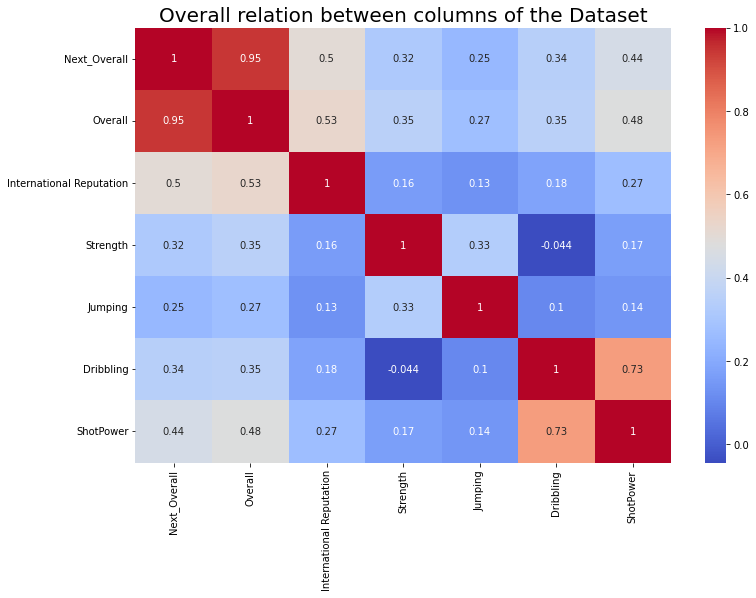

In [56]:
plt.figure(figsize=(12,8))
sns.heatmap(cmbnd_df[['Next_Overall' ,'Overall', 'International Reputation', 'Strength', 'Jumping', 'Dribbling', 'ShotPower']].corr(),cmap='coolwarm', annot = True) #overall correlation between the various columns present in our data
plt.title('Overall relation between columns of the Dataset', fontsize = 20)
plt.show()

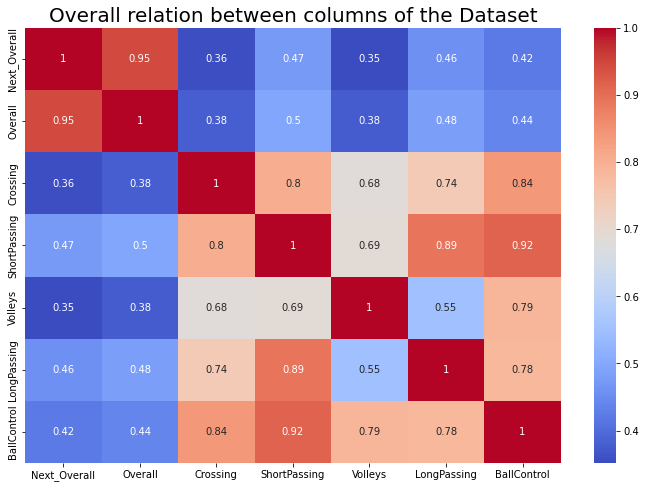

In [57]:
plt.figure(figsize=(12,8))
sns.heatmap(cmbnd_df[['Next_Overall', 'Overall', 'Crossing', 'ShortPassing', 'Volleys', 'LongPassing', 'BallControl']].corr(),cmap='coolwarm', annot = True) #overall correlation between the various columns present in our data
plt.title('Overall relation between columns of the Dataset', fontsize = 20)
plt.show()

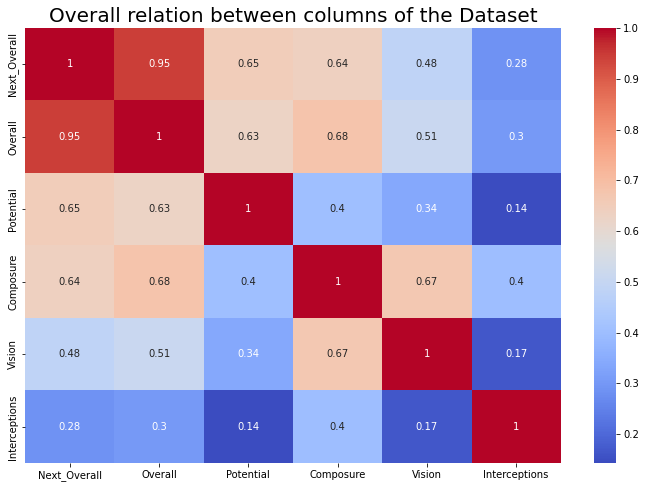

In [55]:
plt.figure(figsize=(12,8))
sns.heatmap(cmbnd_df[['Next_Overall', 'Overall', 'Potential', 'Composure', 'Vision', 'Interceptions']].corr(),cmap='coolwarm', annot = True) #overall correlation between the various columns present in our data
plt.title('Overall relation between columns of the Dataset', fontsize = 20)
plt.show()

### Real life Correlations

In [58]:
real_life_path = r"Dataset\After-PreProcess\predict-with-real-life-stats"

In [60]:
real_prem_df = pd.read_csv(real_life_path+"/full_df_with_stats.csv" ,low_memory = False)

In [61]:
real_prem_df

,Unnamed: 0,ID,Name,Age,Overall,Potential,Club,Value,Wage,International Reputation,...,npxG,xA,npxG+xA,xG.1,xA.1,xG+xA,npxG.1,npxG+xA.1,First Name,Name_Adjusted_stats_df
0,0,212198,Bruno Fernandes,26,88,89,Manchester United,107500000,250000,3.0,...,8.2,8.4,16.6,0.28,0.24,0.53,0.24,0.48,Bruno,B. Fernandes
1,1,192985,K. De Bruyne,30,91,91,Manchester City,125500000,350000,4.0,...,6.4,9.5,15.9,0.26,0.39,0.65,0.26,0.65,Kevin,K. De. Bruyne
2,2,212462,Alex Telles,28,82,82,Manchester United,27500000,130000,3.0,...,0.5,2.0,2.4,0.03,0.11,0.13,0.03,0.13,Alex,A. Telles
3,3,210514,João Cancelo,27,86,87,Manchester City,71500000,185000,3.0,...,4.1,5.1,9.3,0.12,0.14,0.26,0.12,0.26,João,J. Cancelo
4,4,231281,T. Alexander-Arnold,22,87,92,Liverpool,114000000,150000,3.0,...,2.7,11.2,13.9,0.08,0.35,0.44,0.08,0.44,Trent,T. Alexander-Arnold
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
424,470,240913,C. Kelleher,22,67,79,Liverpool,2200000,17000,1.0,...,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,Caoimhín,C. Kelleher
425,471,243675,K. Scherpen,21,69,81,Brighton & Hove Albion,3000000,12000,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Kjell,K. Scherpen
426,472,246671,A. Okonkwo,19,61,77,Arsenal,750000,3000,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Arthur,A. Okonkwo
427,474,259430,Marcelo Pitaluga,18,57,78,Liverpool,475000,1000,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Marcelo,M. Pitaluga


In [64]:
real_prem_df.columns

Index(['Unnamed: 0', 'ID', 'Name', 'Age', 'Overall', 'Potential', 'Club',
       'Value', 'Wage', 'International Reputation', 'Weak Foot', 'Skill Moves',
       'Work Rate', 'Body Type', 'Position', 'Height', 'Weight', 'Crossing',
       'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
       'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
       'GKKicking', 'GKPositioning', 'GKReflexes', 'Best Position',
       'DefensiveAwareness', 'version', 'Next_Overall', 'Next_Year_Club',
       'Name_Adjusted', 'First Initial', 'Last Name', 'Player', 'Team',
       'Nation', 'Pos', 'MP', 'Starts', 'Min', '90s', 'Gls', 'Ast', 'G-PK',
       'PK', 'PKatt', 'CrdY', 'C

In [ ]:
plt.figure(figsize=(12,8))
sns.heatmap(real_prem_df[['Next_Overall' ,'Overall','MP', 'Starts', 'Gls', 'Ast']].corr(),cmap='coolwarm', annot = True) #overall correlation between the various columns present in our data
plt.title('Overall relation between columns of the Dataset', fontsize = 20)
plt.show()

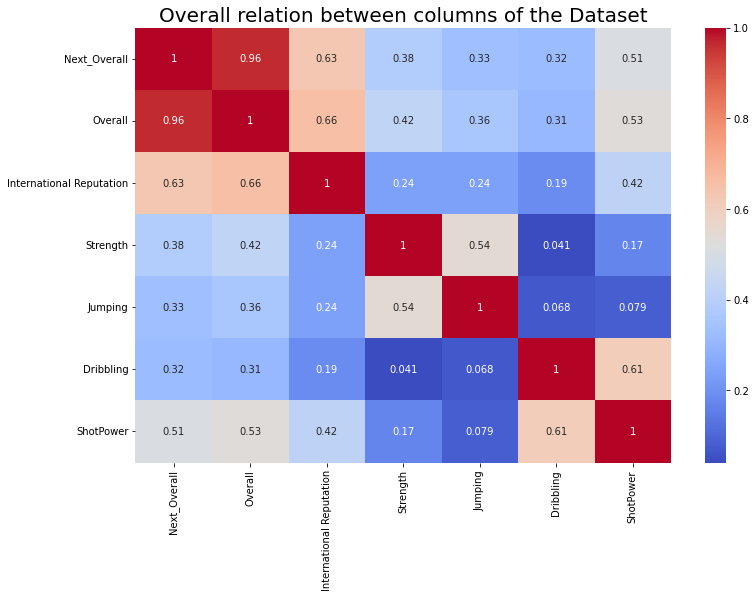

In [63]:
plt.figure(figsize=(12,8))
sns.heatmap(real_prem_df[['Next_Overall' ,'Overall', 'International Reputation', 'Strength', 'Jumping', 'Dribbling', 'ShotPower']].corr(),cmap='coolwarm', annot = True) #overall correlation between the various columns present in our data
plt.title('Overall relation between columns of the Dataset', fontsize = 20)
plt.show()

In [8]:
def calculate_delta(df, field1, field2, new_field):
    df[new_field] = df[field1]-df[field2]
    return df

In [3]:
folder = f"Dataset\After-PreProcess\predict-by-rating"

In [5]:
cdf = pd.read_csv(folder+"/Combined_Data.csv")

In [11]:
cdf

,Unnamed: 0,ID,Name,Age,Overall,Potential,Club,Value,Wage,International Reputation,...,GKHandling,GKKicking,GKPositioning,GKReflexes,Best Position,version,Next_Overall,Next_Year_Club,DefensiveAwareness,Delta
0,0,176580,L. Suárez,29,92,92,FC Barcelona,107500000,250000,5.0,...,25.0,31.0,33.0,37.0,ST,2017,92.0,FC Barcelona,50,0.0
1,1,178518,R. Nainggolan,28,86,86,Roma,93000000,140000,3.0,...,11.0,14.0,8.0,11.0,CDM,2017,86.0,Roma,79,0.0
2,2,181872,A. Vidal,29,87,87,FC Bayern München,44500000,135000,4.0,...,2.0,4.0,2.0,4.0,CDM,2017,86.0,FC Bayern München,85,1.0
3,3,197445,D. Alaba,24,86,89,FC Bayern München,125500000,350000,4.0,...,7.0,14.0,15.0,9.0,LB,2017,85.0,FC Bayern München,81,1.0
4,4,195864,P. Pogba,23,88,94,Manchester United,37000000,45000,4.0,...,6.0,2.0,4.0,3.0,CAM,2017,88.0,Manchester United,72,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68477,16698,254562,A. Abaz,19,50,70,FC St. Gallen 1879,120000,500,1.0,...,53.0,50.0,48.0,50.0,GK,2022,50.0,FC Winterthur,7,0.0
68478,16699,262373,F. Chalupniczak,20,51,63,Sutton United,120000,800,1.0,...,52.0,51.0,51.0,52.0,GK,2022,51.0,Sutton United,9,0.0
68479,16701,263373,J. Searle,20,51,64,Swansea City,120000,2000,1.0,...,53.0,52.0,49.0,50.0,GK,2022,51.0,Barnsley,7,0.0
68480,16703,259718,F. Gebhardt,19,52,66,FC Basel 1893,170000,650,1.0,...,45.0,47.0,52.0,57.0,GK,2022,58.0,Hallescher FC,6,-6.0


In [9]:
cdf = calculate_delta(cdf.copy(),"Overall","Next_Overall" , "Delta" )

## Rating Change Distribution

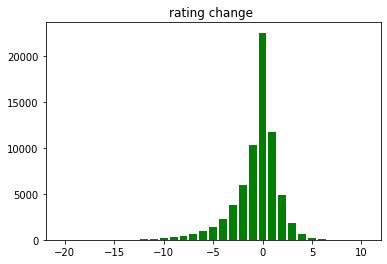

In [21]:
counts = cdf["Delta"].value_counts()
fig, ax = plt.subplots()
rects1 = ax.bar(counts.index, counts.values, width=0.8, color='g')


# Add a title
ax.set_title("rating change ")



# Show the plot
plt.show()

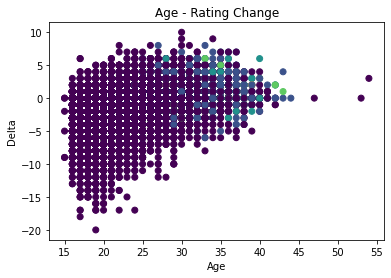

In [23]:
# Create a scatterplot
plt.scatter(cdf['Age'], cdf["Delta"] , c=cdf['International Reputation'])

# Add a title
plt.title('Age - Rating Change')

# Add labels to the axes
plt.xlabel('Age')
plt.ylabel("Delta")

# Show the plot
plt.show()

<AxesSubplot:xlabel='Age', ylabel='Delta'>

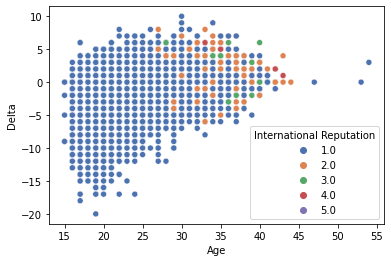

In [25]:
sns.scatterplot(data=cdf, x='Age', y="Delta", hue='International Reputation' ,  palette="deep")